# Stable Diffusion with 🤗 Diffusers

**Pedro Cuenca, Patrick von Platen, Suraj Patil**

Chances are you'll have seen examples in Twitter (and elsewhere) of images generated by typing a short description of the scene you want to create. This is the culmination of years of work in generative models. This notebook explores Stable Diffusion, the highest-quality open source text to image model as of now. It's also small enough to run in consumer GPUs rather than in a datacenter.

_**As we'll see during the course**_, creating a state-of-the-art generative model requires a deep understanding of many of the fundamental blocks in modern machine learning models. This notebook shows what Stable Diffusion can do and a glimpse of its main components. We use the 🤗 Hugging Face [🧨 Diffusers library](https://github.com/huggingface/diffusers).

One interesting consequence of the release of models like Stable Diffusion as open source is that people are finding creative ways to use them for much more than just text to image generation. We are seeing image to image applications like in-painting, plugins for Photoshop or Figma, full-featured editing applications, and more. We'll explore some of them in this notebook.

_**text like this**_: notes for review. For example, in the second paragraph above I'm not sure if we want to tie this to the course or make it standalone.

_**This notebook currently requires diffusers @ main, we are planning a PyPi release by tomorrow (Oct 7th)**_.

## Using Stable Diffusion

To run Stable Diffusion on your computer you have to accept the model license. It's an open CreativeML OpenRail-M license that claims no rights on the outputs you generate and prohibits you from deliberately producing illegal or harmful content. If you are reproducing this notebook locally, please visit the [model card](https://huggingface.co/CompVis/stable-diffusion-v1-4) and take your time to read it. 

If you do accept it, you need to be a registered user in 🤗 Hugging Face Hub and use an access token for the code to work. You have two options to provide your access token:

* Use the `huggingface-cli login` command-line tool in your terminal and paste your token when prompted. It will be saved in a file in your computer.
* Or use `notebook_login()` in a notebook, which does the same thing. Uncomment the following cell if you want to use this method and haven't logged in yet.

In [ ]:
# from huggingface_hub import notebook_login
# notebook_login()

### Stable Diffusion Pipeline

`StableDiffusionPipeline` is an end-to-end inference pipeline that allows you to start generating images with just a few lines of code.

We use `from_pretrained` to create the pipeline and download the pretrained weights. We indicate that we want to use the `fp16` (half-precision) version of the weights, and we tell `diffusers` to expect the weights in that format. This allows us to perform much faster inference with almost no discernible difference in quality.

In [1]:
import torch
from diffusers import StableDiffusionPipeline
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", revision="fp16", torch_dtype=torch.float16)  
pipe = pipe.to("cuda")

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

We are now ready to use the pipeline to start creating images.

  0%|          | 0/51 [00:00<?, ?it/s]

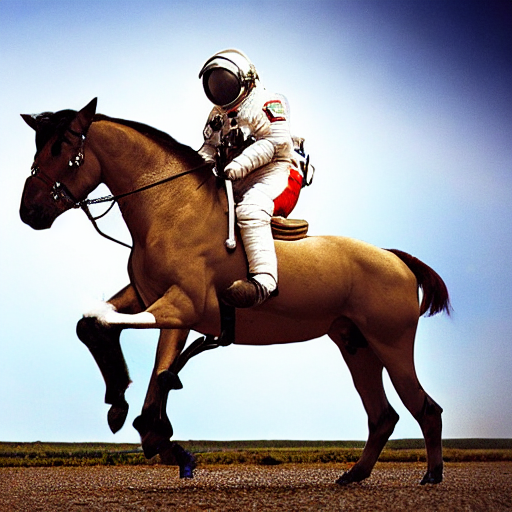

In [3]:
prompt = "a photograph of an astronaut riding a horse"
image = pipe(prompt).images[0]
image

Running the above cell multiple times will give you a different image every time. If you want deterministic output you can pass a random number generator initialized with a known state.

  0%|          | 0/51 [00:00<?, ?it/s]

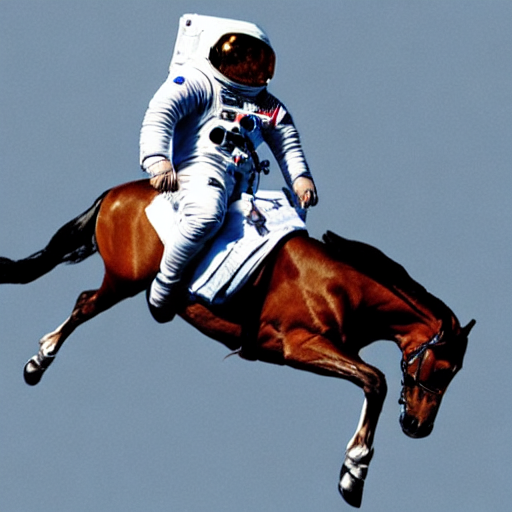

In [4]:
generator = torch.Generator("cuda").manual_seed(1024)
image = pipe(prompt, generator=generator).images[0]
image

_**TODO**_: refactor the generator in a little function

You will have noticed that running the pipeline shows a progress bar with a certain number of steps. This is because Stable Diffusion is based on a progressive denoising algorithm that is able to create a convincing image starting from pure random noise. Models in this family are known as _diffusion models_.

Early versions of diffusion required a large number of steps, such as 1000, to create good results. This was later improved and Stable Diffusion, being one of the latest models, can work with just 50 inference steps.

If you want to get results faster, you can reduce it further using the `num_inference_steps` argument.

The following cell uses the same seed as before, but with fewer steps. Note that the composition is the same, but it's blurry, details are less defined and some areas are half done.

  0%|          | 0/17 [00:00<?, ?it/s]

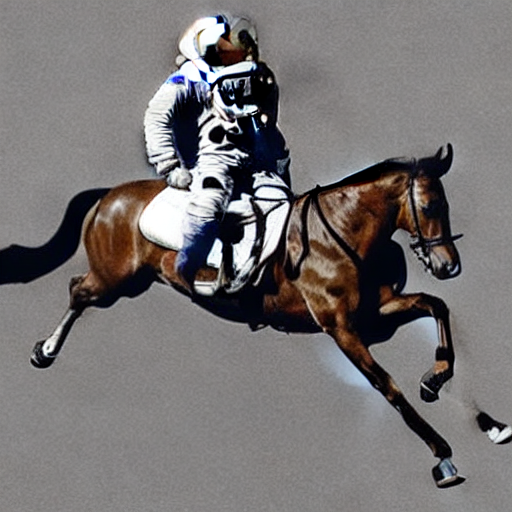

In [12]:
generator = torch.Generator("cuda").manual_seed(1024)
image = pipe(prompt, num_inference_steps=16, generator=generator).images[0]
image

_(Sidenote for the observant: the number of steps in the progress bar is not the same as the one we indicated when calling the pipeline. This is because of some technicalities of the particular noise scheduler used by Stable Diffusion)_

We can show the difference by running several inference runs with an increasing number of steps each time. Let's create a helper function to display results in a grid.

In [13]:
from PIL import Image

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

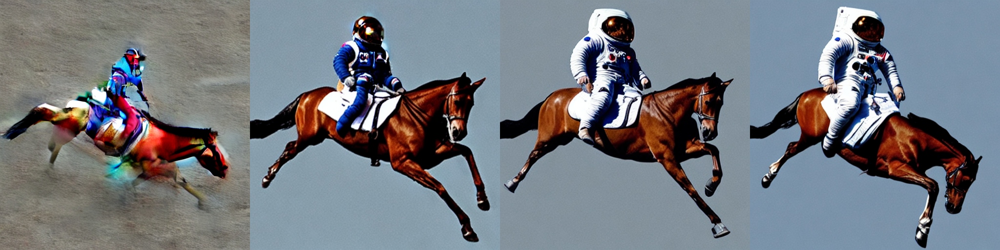

In [35]:
images = []
steps = range(5, 51, 15)
for s in steps:
    generator = torch.Generator("cuda").manual_seed(1024)
    image = pipe(prompt, num_inference_steps=s, generator=generator).images[0]
    images.append(image)
    
image_grid(images, 1, len(steps))

**Note**: This is _not_ showing the progress of the denoising algorithm. For every prediction we ask the model to do its best to produce an image in the specified number of steps. We'll later visualize how the denoising process actually works, for a given number of steps.

### Classifier-Free Guidance

Another interesting parameter in the pipeline is `guidance_scale`. _Guidance_ refers to a technique known as _Classifier-Free Guidance_, which is a method to increase the adherence of the output to the conditioning signal we used (the text).

Roughly speaking, the larger the guidance the more the model tries to represent the text prompt. However, large values tend to produce less diversity. The default is `7.5`, which represents a good compromise between variety and fidelity.

_**TODO: conceptual intuition about scaling the difference between the conditioned/unconditioned generations. We haven't spoken much about denoising yet.**_

There are more details about this method in _**[another section](#pending)**_ of this notebook. This [blog post](https://benanne.github.io/2022/05/26/guidance.html) goes into deeper details on how it works.

We can also generate multiple images for the same prompt by simply passing a list of prompts instead of a string.

_**To be replaced with `num_images_per_prompt` when [#741](https://github.com/huggingface/diffusers/pull/741) is merged, as it's more efficient**_

Guidance scale: 1.0


  0%|          | 0/51 [00:00<?, ?it/s]

Guidance scale: 14.0


  0%|          | 0/51 [00:00<?, ?it/s]

Guidance scale: 27.0


  0%|          | 0/51 [00:00<?, ?it/s]

Guidance scale: 40.0


  0%|          | 0/51 [00:00<?, ?it/s]

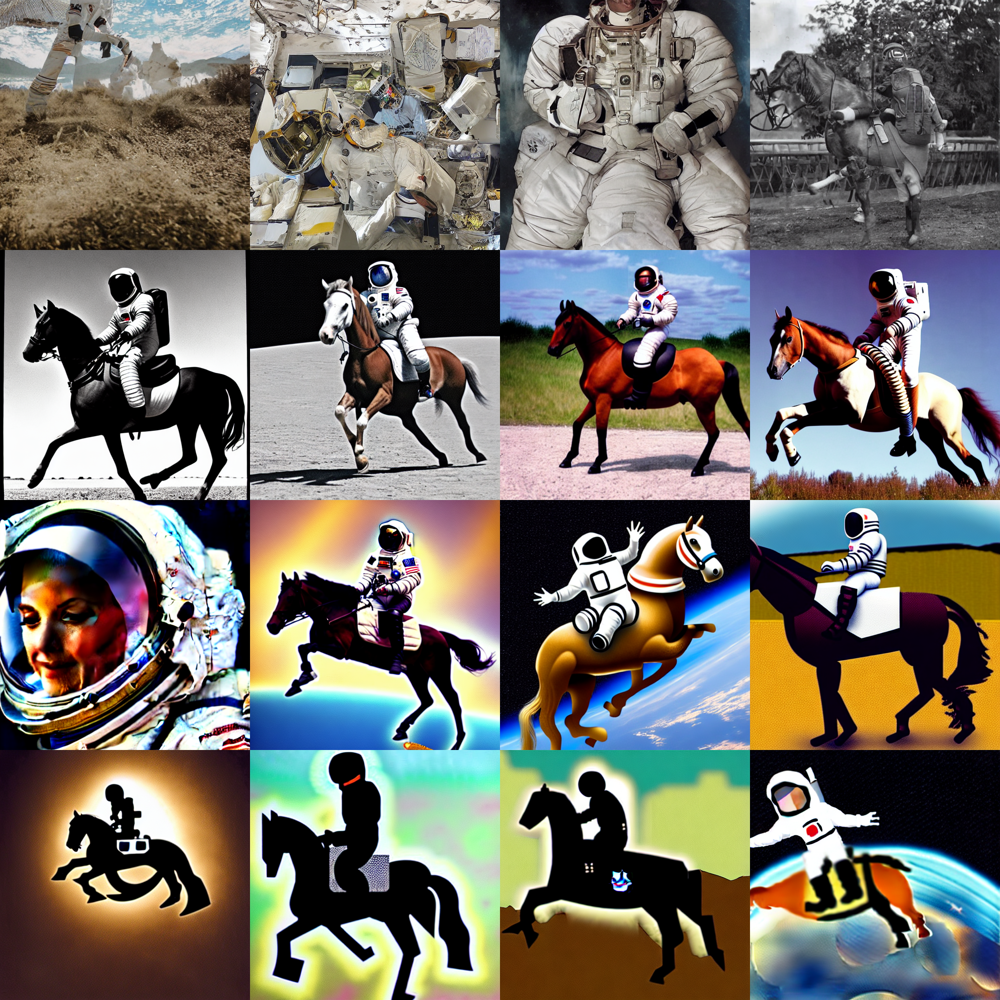

In [61]:
import numpy as np

num_rows = 4
num_cols = 4

g_scales = np.linspace(1, 40, num_rows)
prompt = ["a photograph of an astronaut riding a horse"] * num_cols

images = []
for g in g_scales:
    print(f"Guidance scale: {g}")
    images.extend(pipe(prompt, guidance_scale=g).images)

image_grid(images, rows=num_rows, cols=num_cols)

### Negative prompts

On the topic of classifier-free guidance, some creative minds came up with the concept of _negative prompting_. _**We use another prompt instead of a completely unconditioned generation and scale the difference between generations of that prompt and the conditioned generation.**_

  0%|          | 0/51 [00:00<?, ?it/s]

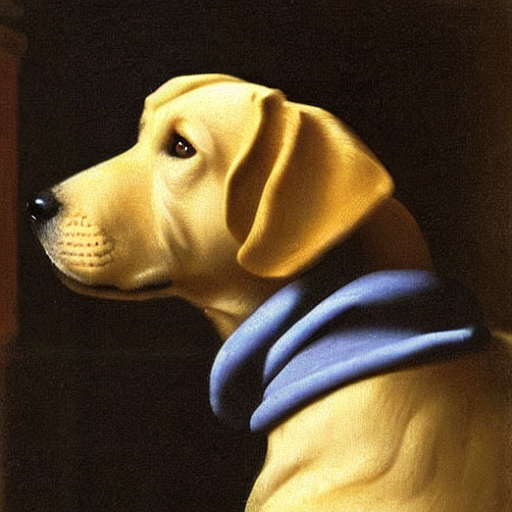

In [72]:
generator = torch.Generator("cuda").manual_seed(1000)
prompt = "Labrador in the style of Vermeer"
pipe(prompt, generator=generator).images[0]

  0%|          | 0/51 [00:00<?, ?it/s]

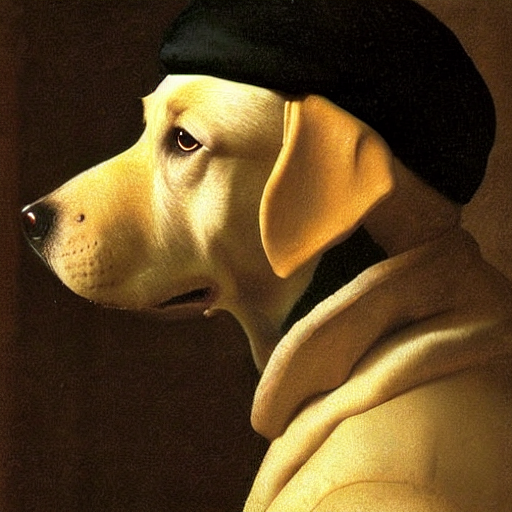

In [73]:
generator = torch.Generator("cuda").manual_seed(1000)
pipe(prompt, negative_prompt="blue", generator=generator).images[0]

By using the negative prompt we move more towards the direction of the positive prompt, effectively reducing the importance of the negative prompt in our composition.

### Non-square images

Stable Diffusion produces images of `512 × 512` pixels by default. We can use the `height` and `width` arguments to override and create rectangular images in portrait or landscape aspect ratios.

Going beyond `512`, however, can be tricky, as the model tends to repeat previous parts of the image.

  0%|          | 0/51 [00:00<?, ?it/s]

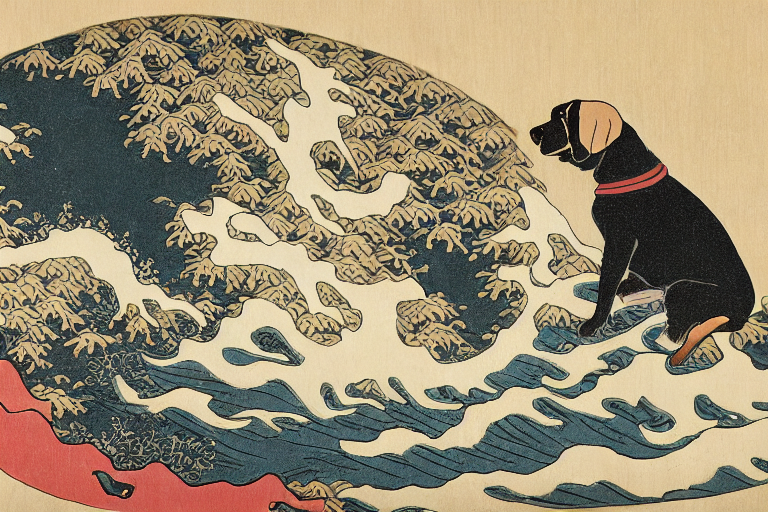

In [78]:
generator = torch.Generator("cuda").manual_seed(7667)
prompt = "Labrador in the style of Hokusai"
pipe(prompt, width=768, generator=generator).images[0]

### Callbacks: Visualizing the denoising process

_**To be used later, after we have introduced latent space and denoising.**_

The Stable Diffusion pipeline can send intermediate latents to a callback function we provide. By running these latents through the image decoder (the `vae` component of the pipeline), we can see how the denoising process progresses and the image unfolds.

  0%|          | 0/51 [00:00<?, ?it/s]

Decoding latents after iteration 0, timestep 981
Decoding latents after iteration 12, timestep 761
Decoding latents after iteration 24, timestep 521
Decoding latents after iteration 36, timestep 281
Decoding latents after iteration 48, timestep 41


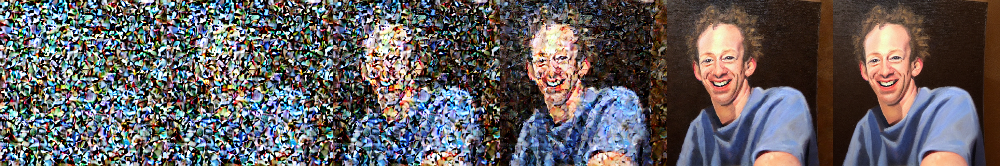

In [86]:
vae = pipe.vae
images = []

# `i`: iteration number, `t`: timestep
def latents_callback(i, t, latents):
    # Scale, decode, denormalize
    print(f"Decoding latents after iteration {i}, timestep {t}")
    latents = 1 / 0.18215 * latents
    image = vae.decode(latents).sample[0]
    image = (image / 2 + 0.5).clamp(0, 1)
    image = image.cpu().permute(1, 2, 0).numpy()
    images.extend(pipe.numpy_to_pil(image))

prompt = "Portrait painting of Jeremy Howard looking happy."
generator = torch.Generator("cuda").manual_seed(1000)
final_image = pipe(prompt, callback=latents_callback, callback_steps=12, generator=generator).images[0]

images.append(final_image)
image_grid(images, rows=1, cols=len(images))

_**Ideas that came up: send the noise in addition to the latents to visualize it. We can do it with a custom pipeline later. Also: send back a new set of latents to the pipeline to allow general-purpose modifications.**_

## What is Stable Diffusion

Now, let's go into the theoretical part of Stable Diffusion 👩‍🎓.

Stable Diffusion is based on a particular type of diffusion model called **Latent Diffusion**, proposed in [High-Resolution Image Synthesis with Latent Diffusion Models](https://arxiv.org/abs/2112.10752).



General diffusion models are machine learning systems that are trained to *denoise* random gaussian noise step by step, to get to a sample of interest, such as an *image*. For a more detailed overview of how they work, check [this colab](https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/diffusers_intro.ipynb).

Diffusion models have shown to achieve state-of-the-art results for generating image data. But one downside of diffusion models is that the reverse denoising process is slow. In addition, these models consume a lot of memory because they operate in pixel space, which becomes unreasonably expensive when generating high-resolution images. Therefore, it is challenging to train these models and also use them for inference.



<br>

Latent diffusion can reduce the memory and compute complexity by applying the diffusion process over a lower dimensional _latent_ space, instead of using the actual pixel space. This is the key difference between standard diffusion and latent diffusion models: **in latent diffusion the model is trained to generate latent (compressed) representations of the images.** 

There are three main components in latent diffusion.

1. An autoencoder (VAE).
2. A [U-Net](https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/diffusers_intro.ipynb#scrollTo=wW8o1Wp0zRkq).
3. A text-encoder, *e.g.* [CLIP's Text Encoder](https://huggingface.co/docs/transformers/model_doc/clip#transformers.CLIPTextModel).

**1. The autoencoder (VAE)**

The VAE model has two parts, an encoder and a decoder. The encoder is used to convert the image into a low dimensional latent representation, which will serve as the input to the *U-Net* model.
The decoder, conversely, transforms the latent representation back into an image.

 During latent diffusion _training_, the encoder is used to get the latent representations (_latents_) of the images for the forward diffusion process, which applies more and more noise at each step. During _inference_, the denoised latents generated by the reverse diffusion process are converted back into images using the VAE decoder. As we will see during inference we **only need the VAE decoder**.

**2. The U-Net**

The U-Net has an encoder part and a decoder part both comprised of ResNet blocks.
The encoder compresses an image representation into a lower resolution image representation and the decoder decodes the lower resolution image representation back to the original higher resolution image representation that is supposedly less noisy.
More specifically, the U-Net output predicts the noise residual which can be used to compute the predicted denoised image representation.

To prevent the U-Net from losing important information while downsampling, short-cut connections are usually added between the downsampling ResNets of the encoder to the upsampling ResNets of the decoder.
Additionally, the stable diffusion U-Net is able to condition its output on text-embeddings via cross-attention layers. The cross-attention layers are added to both the encoder and decoder part of the U-Net usually between ResNet blocks.

**3. The Text-encoder**

The text-encoder is responsible for transforming the input prompt, *e.g.* "An astronout riding a horse" into an embedding space that can be understood by the U-Net. It is usually a simple *transformer-based* encoder that maps a sequence of input tokens to a sequence of latent text-embeddings.

Inspired by [Imagen](https://imagen.research.google/), Stable Diffusion does **not** train the text-encoder during training and simply uses an CLIP's already trained text encoder, [CLIPTextModel](https://huggingface.co/docs/transformers/model_doc/clip#transformers.CLIPTextModel).

**Why is latent diffusion fast and efficient?**

Since the U-Net of latent diffusion models operates on a low dimensional space, it greatly reduces the memory and compute requirements compared to pixel-space diffusion models. For example, the autoencoder used in Stable Diffusion has a reduction factor of 8. This means that an image of shape `(3, 512, 512)` becomes `(3, 64, 64)` in latent space, which requires `8 × 8 = 64` times less memory.

This is why it's possible to generate `512 × 512` images so quickly, even on 16GB Colab GPUs!

**Stable Diffusion during inference**

Putting it all together, let's now take a closer look at how the model works in inference by illustrating the logical flow.


<p align="left">
<img src="https://raw.githubusercontent.com/patrickvonplaten/scientific_images/master/stable_diffusion.png" alt="sd-pipeline" width="500"/>
</p>

The stable diffusion model takes both a latent seed and a text prompt as an input. The latent seed is then used to generate random latent image representations of size $64 \times 64$ where as the text prompt is transformed to text embeddings of size $77 \times 768$ via CLIP's text encoder.

Next the U-Net iteratively *denoises* the random latent image representations while being conditioned on the text embeddings. The output of the U-Net, being the noise residual, is used to compute a denoised latent image representation via a scheduler algorithm. Many different scheduler algorithms can be used for this computation, each having its pros and cons. For Stable Diffusion, we recommend using one of:

- [PNDM scheduler](https://github.com/huggingface/diffusers/blob/main/src/diffusers/schedulers/scheduling_pndm.py) (used by default)
- [DDIM scheduler](https://github.com/huggingface/diffusers/blob/main/src/diffusers/schedulers/scheduling_ddim.py)
- [K-LMS scheduler](https://github.com/huggingface/diffusers/blob/main/src/diffusers/schedulers/scheduling_lms_discrete.py)

Theory on how the scheduler algorithm function is out of scope for this notebook, but in short one should remember that they compute the predicted denoised image representation from the previous noise representation and the predicted noise residual.
For more information, we recommend looking into [Elucidating the Design Space of Diffusion-Based Generative Models](https://arxiv.org/abs/2206.00364)

The *denoising* process is repeated *ca.* 50 times to step-by-step retrieve better latent image representations.
Once complete, the latent image representation is decoded by the decoder part of the variational auto encoder.



After this brief introduction to Latent and Stable Diffusion, let's see how to make advanced use of 🤗 Hugging Face Diffusers!

## How to write your own inference pipeline with `diffusers`

Finally, we show how you can create custom diffusion pipelines with `diffusers`.
This is often very useful to dig a bit deeper into certain functionalities of the system and to potentially switch out certain components. 

In this section, we will demonstrate how to use Stable Diffusion with a different scheduler, namely [Katherine Crowson's](https://github.com/crowsonkb) K-LMS scheduler that was added in [this PR](https://github.com/huggingface/diffusers/pull/185#pullrequestreview-1074247365).

Let's go through the `StableDiffusionPipeline` step by step to see how we could have written it ourselves.

We will start by loading the individual models involved.

In [15]:
import torch
torch_device = "cuda" if torch.cuda.is_available() else "cpu"

The [pre-trained model](https://huggingface.co/CompVis/stable-diffusion-v1-3-diffusers/tree/main) includes all the components required to setup a complete diffusion pipeline. They are stored in the following folders:
- `text_encoder`: Stable Diffusion uses CLIP, but other diffusion models may use other encoders such as `BERT`.
- `tokenizer`. It must match the one used by the `text_encoder` model.
- `scheduler`: The scheduling algorithm used to progressively add noise to the image during training.
- `unet`: The model used to generate the latent representation of the input.
- `vae`: Autoencoder module that we'll use to decode latent representations into real images.

We can load the components by referring to the folder they were saved, using the `subfolder` argument to `from_pretrained`.

In [16]:
from transformers import CLIPTextModel, CLIPTokenizer
from diffusers import AutoencoderKL, UNet2DConditionModel, PNDMScheduler

# 1. Load the autoencoder model which will be used to decode the latents into image space. 
vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae", use_auth_token=True)

# 2. Load the tokenizer and text encoder to tokenize and encode the text. 
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14")
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14")

# 3. The UNet model for generating the latents.
unet = UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="unet", use_auth_token=True)

Downloading:   0%|          | 0.00/522 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/335M [00:00<?, ?B/s]

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing CLIPTextModel: ['vision_model.encoder.layers.9.layer_norm2.weight', 'vision_model.encoder.layers.21.self_attn.q_proj.weight', 'vision_model.encoder.layers.22.layer_norm1.bias', 'vision_model.encoder.layers.20.mlp.fc2.weight', 'vision_model.encoder.layers.12.self_attn.out_proj.weight', 'vision_model.encoder.layers.23.self_attn.out_proj.bias', 'vision_model.encoder.layers.11.self_attn.v_proj.weight', 'vision_model.encoder.layers.14.self_attn.q_proj.weight', 'vision_model.encoder.layers.19.self_attn.v_proj.weight', 'vision_model.encoder.layers.19.self_attn.k_proj.bias', 'vision_model.encoder.layers.20.layer_norm1.weight', 'vision_model.encoder.layers.10.self_attn.out_proj.weight', 'vision_model.encoder.layers.6.mlp.fc2.weight', 'vision_model.encoder.layers.10.mlp.fc1.weight', 'vision_model.encoder.layers.17.layer_norm1.weight', 'vision_model.encoder.layers.4.self_attn.v_proj.weight', 'vis

Downloading:   0%|          | 0.00/743 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

Now instead of loading the pre-defined scheduler, we load a K-LMS scheduler instead.

In [17]:
from diffusers import LMSDiscreteScheduler

scheduler = LMSDiscreteScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", num_train_timesteps=1000)

Next we move the models to the GPU.

In [18]:
from torch import autocast

vae = vae.to(torch_device)
text_encoder = text_encoder.to(torch_device)
unet = unet.to(torch_device) 

We now define the parameters we'll use to generate images.

Note that `guidance_scale` is defined analog to the guidance weight `w` of equation (2) in the [Imagen paper](https://arxiv.org/pdf/2205.11487.pdf). `guidance_scale == 1` corresponds to doing no classifier-free guidance. Here we set it to 7.5 as also done previously.

In contrast to the previous examples, we set `num_inference_steps` to 100 to get an even more defined image.

In [19]:
prompt = ["a photograph of an astronaut riding a horse"]

height = 512                        # default height of Stable Diffusion
width = 512                         # default width of Stable Diffusion

num_inference_steps = 100            # Number of denoising steps

guidance_scale = 7.5                # Scale for classifier-free guidance

generator = torch.manual_seed(32)   # Seed generator to create the inital latent noise

batch_size = 1

First, we get the text_embeddings for the prompt. These embeddings will be used to condition the UNet model.

In [20]:
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")

with torch.no_grad():
  text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]

We'll also get the unconditional text embeddings for classifier-free guidance, which are just the embeddings for the padding token (empty text). They need to have the same shape as the conditional `text_embeddings` (`batch_size` and `seq_length`)

In [21]:
max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer(
    [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
)
with torch.no_grad():
  uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0]   

For classifier-free guidance, we need to do two forward passes. One with the conditioned input (`text_embeddings`), and another with the unconditional embeddings (`uncond_embeddings`). In practice, we can concatenate both into a single batch to avoid doing two forward passes.

In [22]:
text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

Generate the intial random noise.

In [23]:
latents = torch.randn(
  (batch_size, unet.in_channels, height // 8, width // 8),
  generator=generator,
)
latents = latents.to(torch_device)

In [24]:
latents.shape

torch.Size([1, 4, 64, 64])

Cool $64 \times 64$ is expected. The model will transform this latent representation (pure noise) into a `512 × 512` image later on.

Next, we initialize the scheduler with our chosen `num_inference_steps`.
This will compute the `sigmas` and exact time step values to be used during the denoising process.

In [25]:
scheduler.set_timesteps(num_inference_steps)

The K-LMS scheduler needs to multiply the `latents` by its `sigma` values. Let's do this here

In [26]:
latents = latents * scheduler.sigmas[0]

We are ready to write the denoising loop.

In [27]:
from tqdm.auto import tqdm
from torch import autocast

with autocast("cuda"):
  for i, t in tqdm(enumerate(scheduler.timesteps)):
    # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
    latent_model_input = torch.cat([latents] * 2)
    sigma = scheduler.sigmas[i]
    latent_model_input = latent_model_input / ((sigma**2 + 1) ** 0.5)

    # predict the noise residual
    with torch.no_grad():
      noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample

    # perform guidance
    noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
    noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

    # compute the previous noisy sample x_t -> x_t-1
    latents = scheduler.step(noise_pred, i, latents).prev_sample

0it [00:00, ?it/s]

We now use the `vae` to decode the generated `latents` back into the image.

In [28]:
# scale and decode the image latents with vae
latents = 1 / 0.18215 * latents

with torch.no_grad():
  image = vae.decode(latents).sample

And finally, let's convert the image to PIL so we can display or save it.

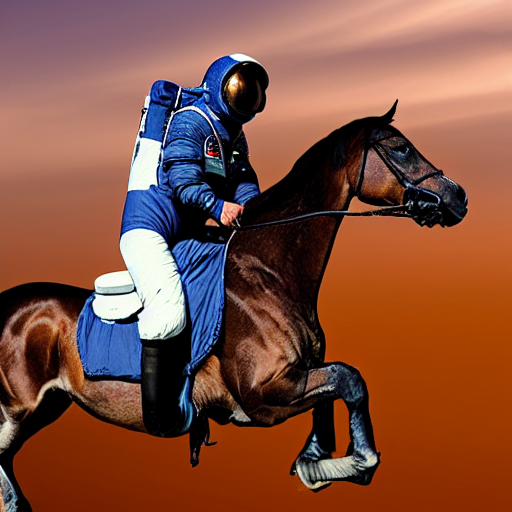

In [29]:
image = (image / 2 + 0.5).clamp(0, 1)
image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
images = (image * 255).round().astype("uint8")
pil_images = [Image.fromarray(image) for image in images]
pil_images[0]

Nice, as we can see the photo has quite a definition 🔥.